In [1]:
'''Please put the right path to the corresponding variable'''

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

import torch

from src.core import models, training, data
from src.special import saliency
from src.utils import visualization as viz
from torchvision import transforms as T

DATA_DIR = '../snake_csv_files/'
DATA='../SnakeCLEF2023-medium_size-train/'
TRAIN_SET_DIR = 'train'

MODEL_ARCH = 'deit_base_distilled_384'
MODEL_NAME = 'clef2023_deit_base_distilled_384_focal_05-05-2023_03-59-23'

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f'Device: {device}')

Device: cpu


In [2]:
train_df = pd.read_csv(DATA_DIR + 'SnakeCLEF2023-cleaned-metadata-train-update.csv')

classes = np.unique(train_df['binomial'])
no_classes = len(classes)
print(f'No classes: {no_classes}')
print(f'Train set length: {len(train_df):,d}')

No classes: 1784
Train set length: 120,553


In [3]:
# create model
model = models.get_model(MODEL_ARCH, no_classes, pretrained=True)
training.load_model(model, MODEL_NAME, path='.')
assert np.all([param.requires_grad for param in model.parameters()])

model_config = model.pretrained_config

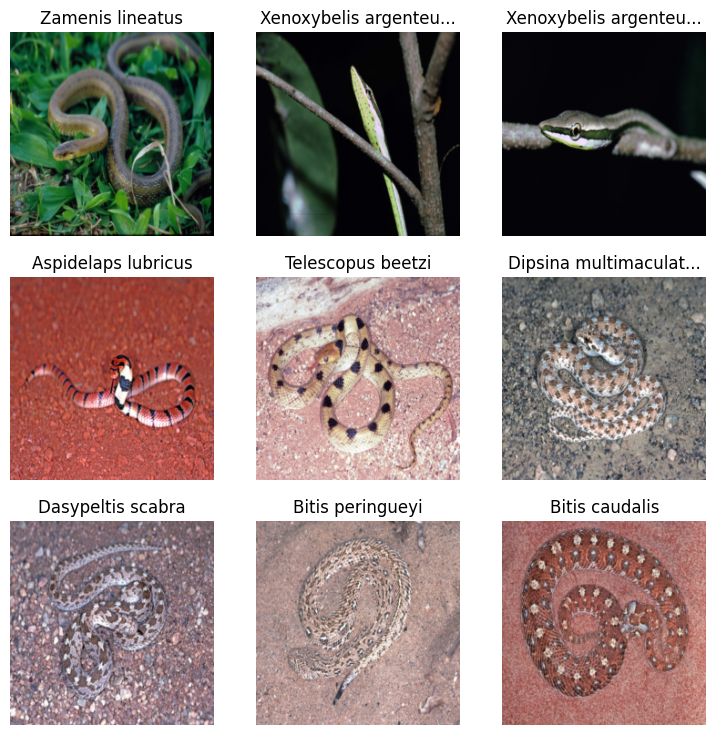

In [4]:
def get_transforms(*, size=224, mean=(0.485, 0.456, 0.406), std=(0.229, 0.224, 0.225)):
    """Create basic image transforms for training or validation dataset."""
    train_tfms = T.Compose([
        T.RandomResizedCrop((size, size), scale=(0.8, 1.0)),
        T.RandomHorizontalFlip(p=0.5),
        T.RandomVerticalFlip(p=0.5),
        T.RandomApply(torch.nn.ModuleList([
            T.ColorJitter(brightness=0.2, contrast=0.2)
        ]), p=0.2),  # random brightness contrast
        T.ToTensor(),
        T.Normalize(mean, std)])
    valid_tfms = T.Compose([
        T.Resize((size, size)),
        T.ToTensor(),
        T.Normalize(mean, std)])
    return train_tfms, valid_tfms

_, tfms = get_transforms(
    size=model_config['input_size'], mean=model_config['image_mean'],
    std=model_config['image_std'])

# create dataset
dataset = data.ImageDataset(
    train_df, img_path_col='image_path', label_col='binomial',
    path=DATA , transforms=tfms)

dataset.show_items(range(9))

In [5]:
# get image
img_idx = 3
img, label = dataset[img_idx]

# create saliency map
saliency_map = saliency.get_saliency_map(model, img, label=label)

# binarize saliency map
saliency_map_bin = saliency.binarize_saliency_map(saliency_map, percentile=95)

# get bounding box covering highest intensities
bbox, saliency_map_cleaned = saliency.get_bounding_box(
    saliency_map, bin_percentile=95, clust_pixel_th=10)

In [6]:
dataset.id2label(label)

'Aspidelaps lubricus'

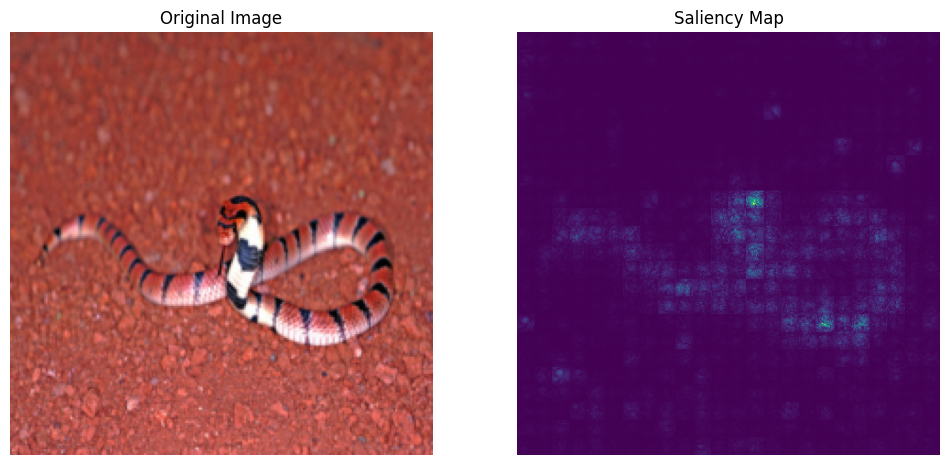

In [7]:
# plot image and saliency map
fig, (ax1, ax2) = viz.create_fig(ncols=2, colsize=6, rowsize=6)
# viz.imshow(img, ax=ax1)
dataset.show_item(img_idx, ax=ax1)
ax1.axis('off')
ax1.set(title='Original Image')
ax2.imshow(saliency_map, cmap='viridis')
ax2.axis('off')
ax2.set(title='Saliency Map')
# fig.tight_layout()
plt.show()

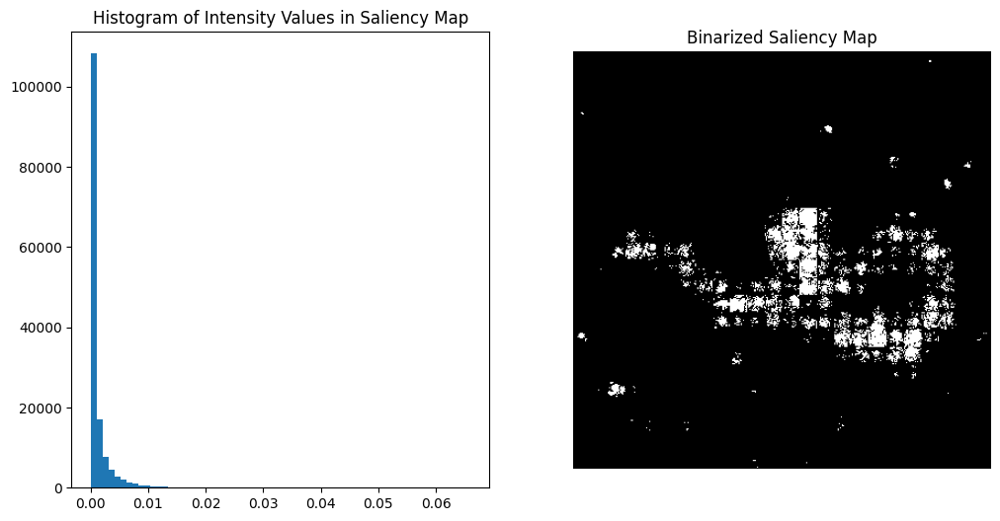

In [8]:
# plot histogram and binarized saliency map
fig, (ax1, ax2) = viz.create_fig(ncols=2, colsize=6, rowsize=6)
ax1.hist(saliency_map.reshape(-1), bins=64)
ax1.set(title='Histogram of Intensity Values in Saliency Map')
ax2.imshow(saliency_map_bin, cmap='gray')
ax2.axis('off')
ax2.set(title='Binarized Saliency Map')
plt.show()

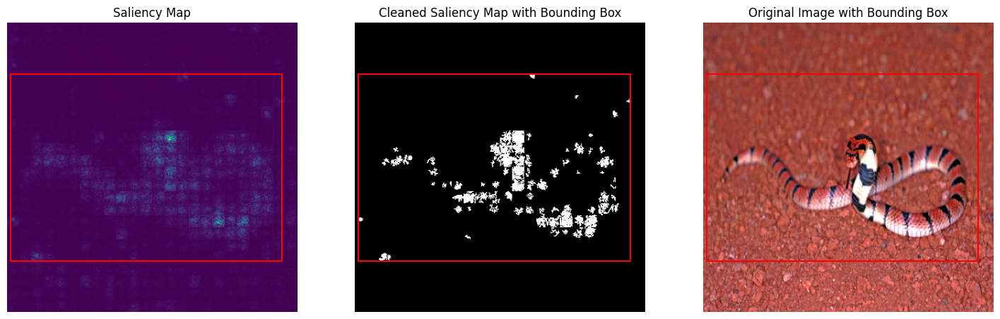

In [9]:

# plot cleaned saliency map with bounding box
fig, (ax1, ax2, ax3) = viz.create_fig(ncols=3, colsize=6, rowsize=6)

viz.imshow(saliency_map, ax=ax1, cmap='viridis', bbox=bbox)
ax1.axis('off')
ax1.set(title='Saliency Map')

viz.imshow(saliency_map_cleaned, ax=ax2, cmap='gray', bbox=bbox)
ax2.axis('off')
ax2.set(title='Cleaned Saliency Map with Bounding Box')

dataset.show_item(img_idx, ax=ax3,apply_transforms=tfms)
viz.plot_bbox(bbox, ax=ax3)
ax3.axis('off')
ax3.set(title='Original Image with Bounding Box')

plt.show()



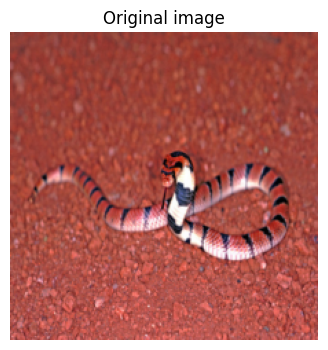

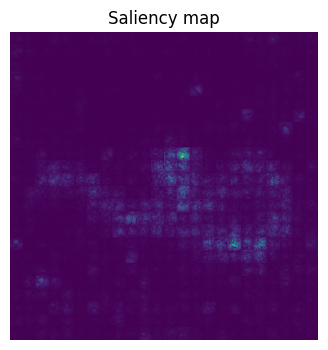

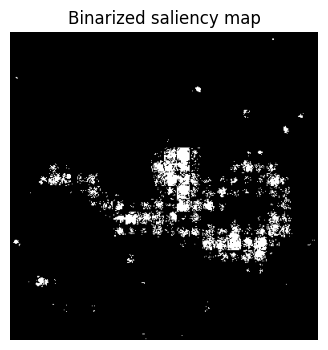

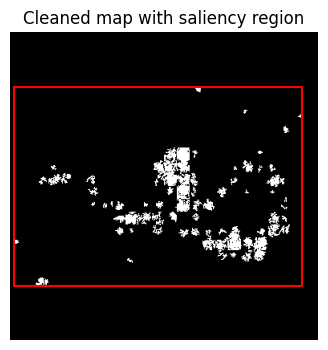

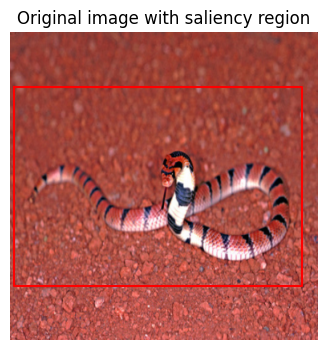

In [18]:
fig, ax = viz.create_fig(colsize=4, rowsize=4)
dataset.show_item(img_idx, ax=ax)
ax.set(title='Original image')
ax.axis('off')
plt.show()
fig.savefig('figures/snake_saliency/original_image.png', bbox_inches='tight')

fig, ax = viz.create_fig(colsize=4, rowsize=4)
viz.imshow(saliency_map, ax=ax, cmap='viridis')
ax.set(title='Saliency map')
ax.axis('off')
plt.show()
fig.savefig('figures/snake_saliency/saliency_map.png', bbox_inches='tight')

fig, ax = viz.create_fig(colsize=4, rowsize=4)
viz.imshow(saliency_map_bin, ax=ax, cmap='gray')
ax.set(title='Binarized saliency map')
ax.axis('off')
plt.show()
fig.savefig('figures/snake_saliency/saliency_map_binarized.png', bbox_inches='tight')

fig, ax = viz.create_fig(colsize=4, rowsize=4)
viz.imshow(saliency_map_cleaned, ax=ax, cmap='gray', bbox=bbox)
ax.set(title='Cleaned map with saliency region')
ax.axis('off')
plt.show()
fig.savefig('figures/snake_saliency/cleaned_map_with_saliency_box.png', bbox_inches='tight')

fig, ax = viz.create_fig(colsize=4, rowsize=4)
dataset.show_item(img_idx, ax=ax,apply_transforms=tfms)
viz.plot_bbox(bbox, ax=ax)
ax.set(title='Original image with saliency region')
ax.axis('off')
plt.show()
fig.savefig('figures/snake_saliency/original_image_with_saliency_box.png', bbox_inches='tight')

1990/Zamenis_lineatus/3001242.jpg


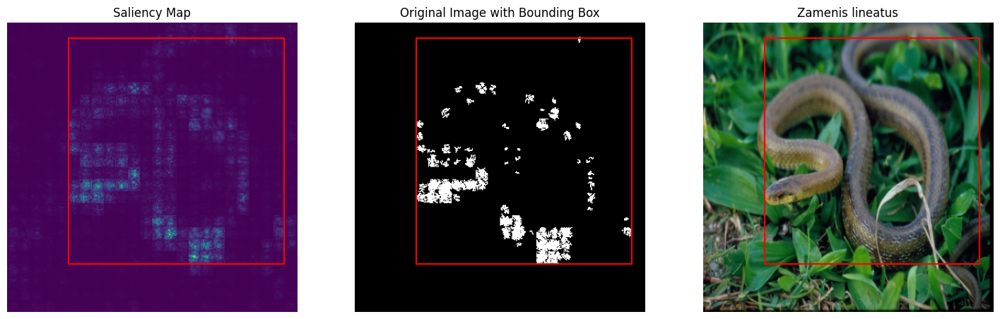

1990/Xenoxybelis_argenteus/113910655.jpg


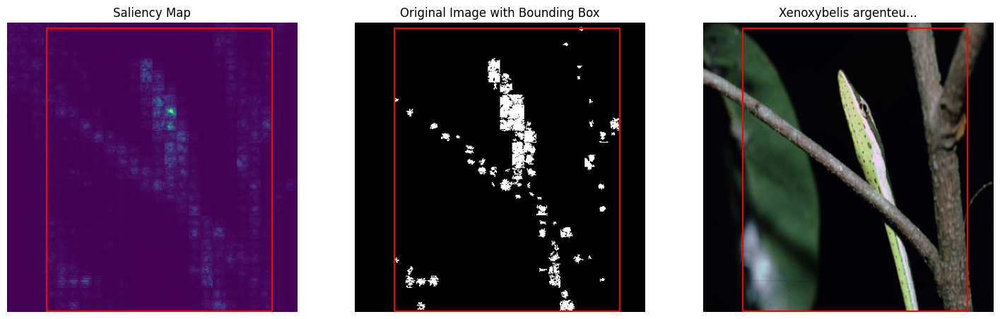

1990/Xenoxybelis_argenteus/113910659.jpg


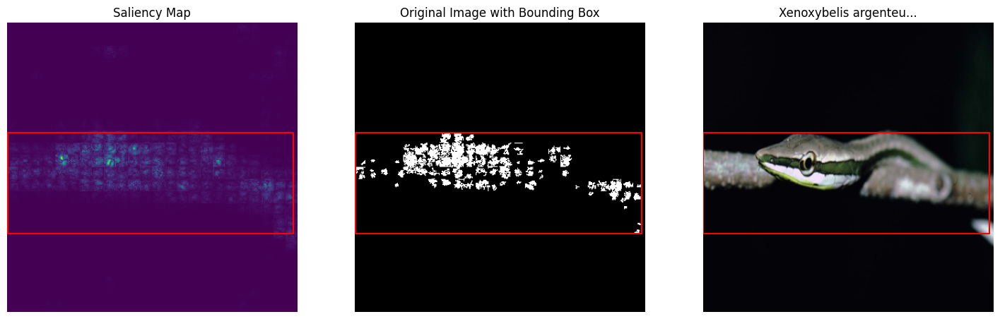

1990/Aspidelaps_lubricus/168477.JPG


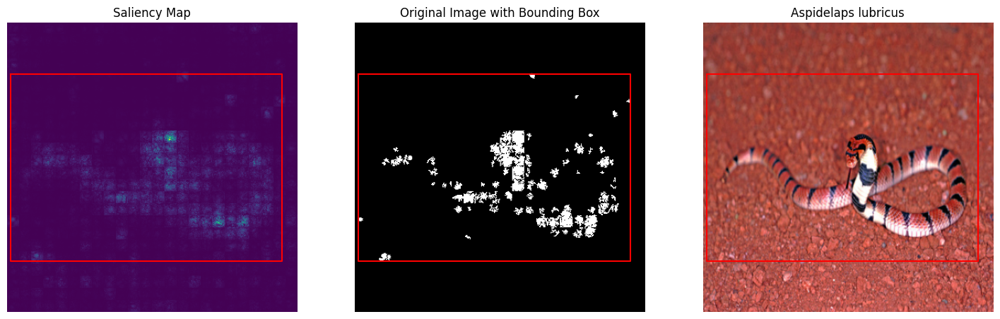

1990/Telescopus_beetzi/177365.JPG


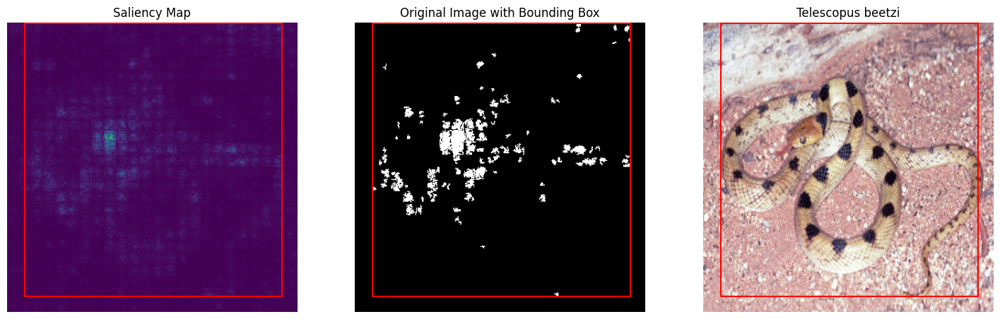

1990/Dipsina_multimaculata/177336.JPG


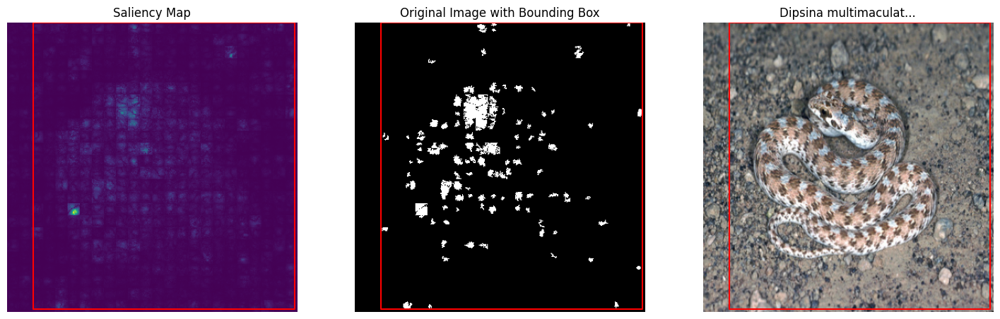

1990/Dasypeltis_scabra/177337.JPG


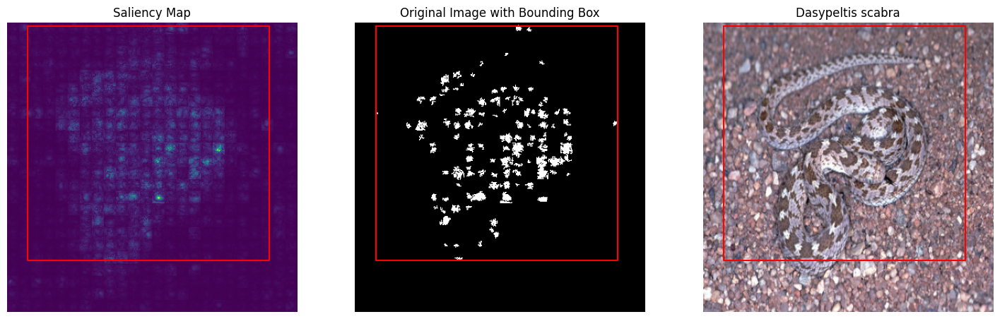

1990/Bitis_peringueyi/1358706.JPG


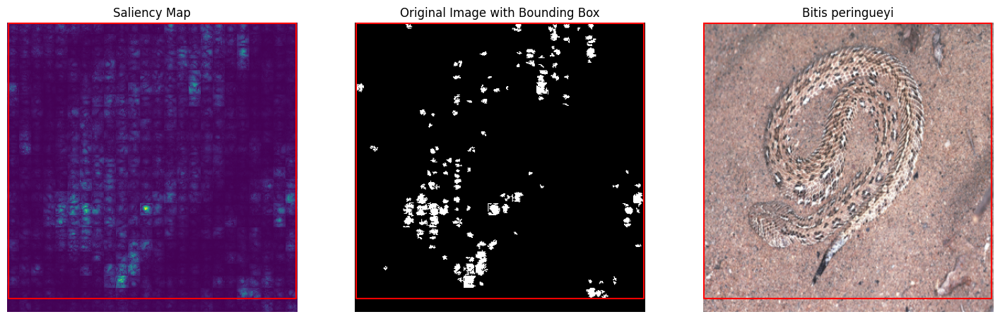

1990/Bitis_caudalis/168482.JPG


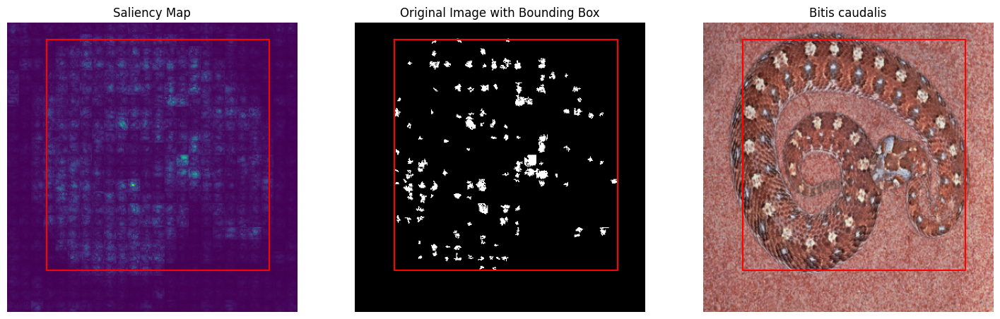

1990/Lampropeltis_annulata/7437403.jpg


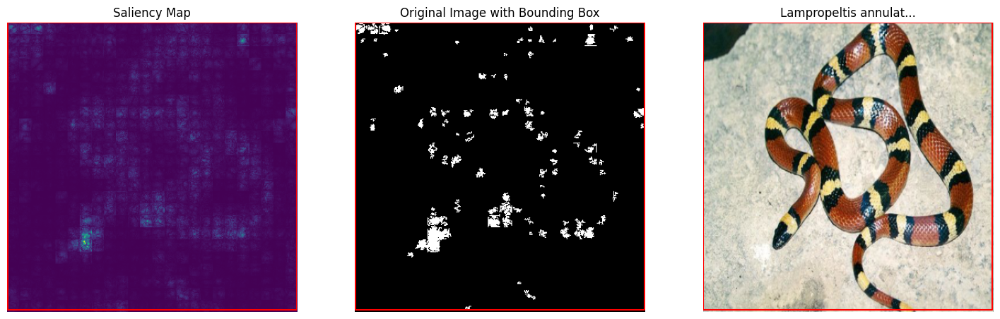

1990/Elaphe_schrenckii/57902708.jpg


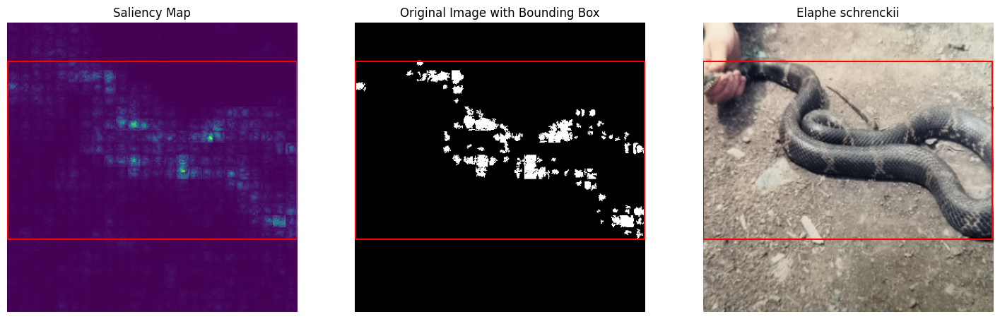

1990/Gloydius_intermedius/57909018.jpg


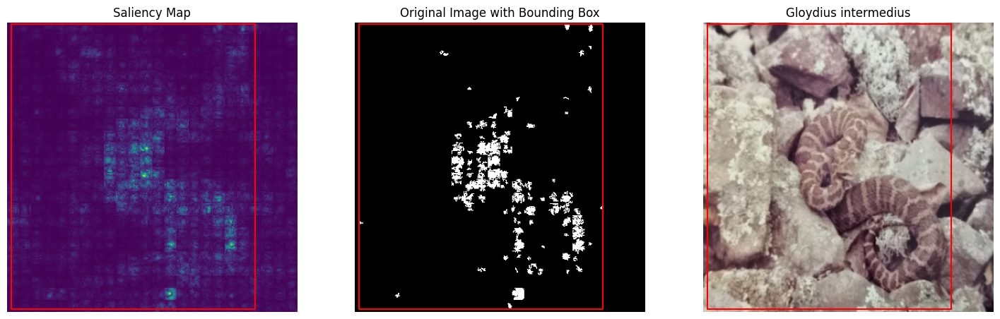

1990/Amphiesma_stolatum/59067968.jpg


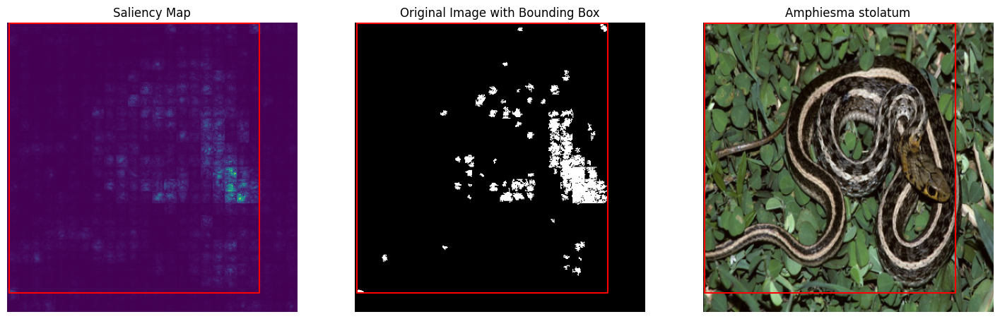

1990/Oligodon_taeniatus/59067926.jpg


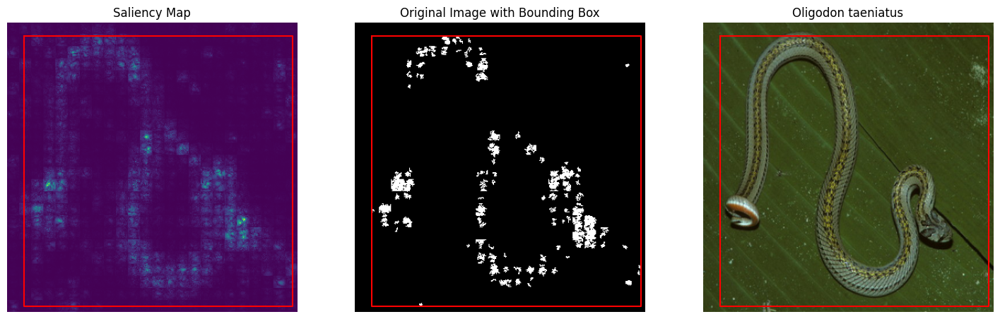

1990/Vipera_berus/111487306.jpeg


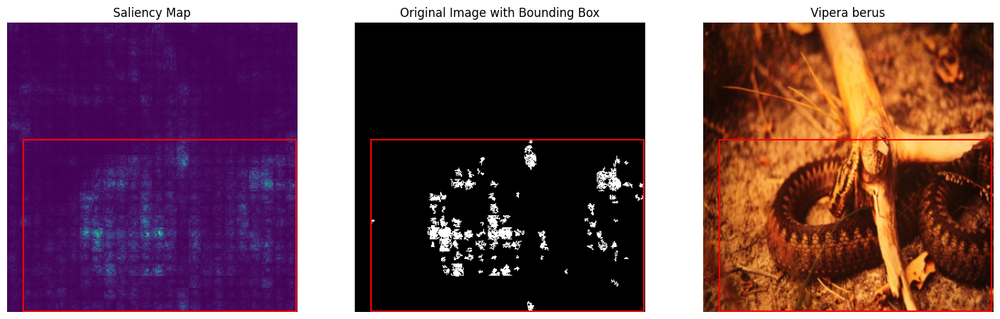

1990/Coronella_austriaca/111486989.jpeg


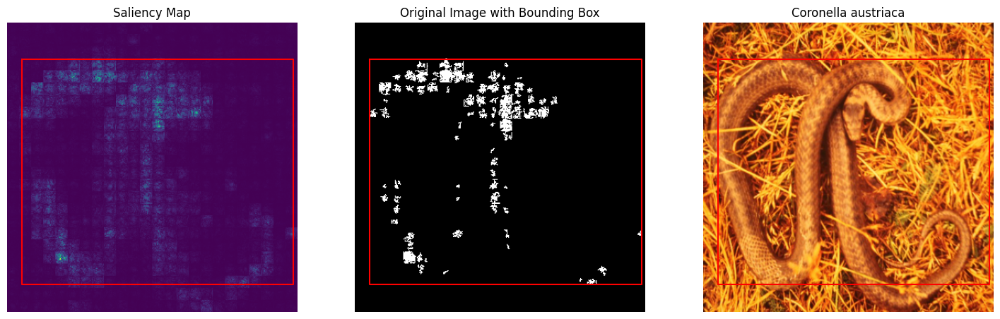

1991/Calabaria_reinhardtii/174177.JPG


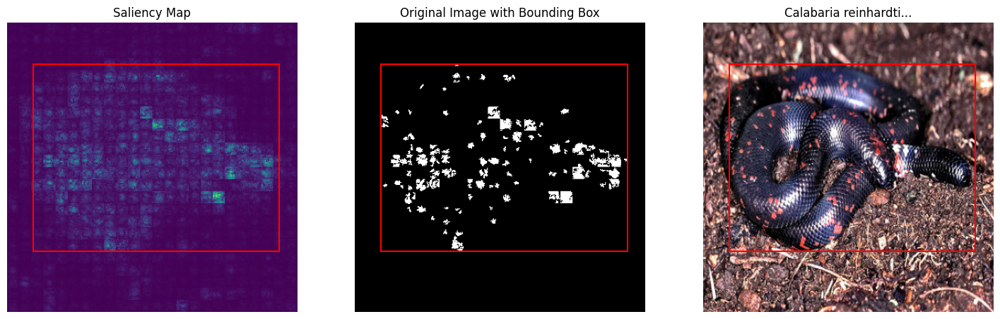

1991/Causus_maculatus/177715.JPG


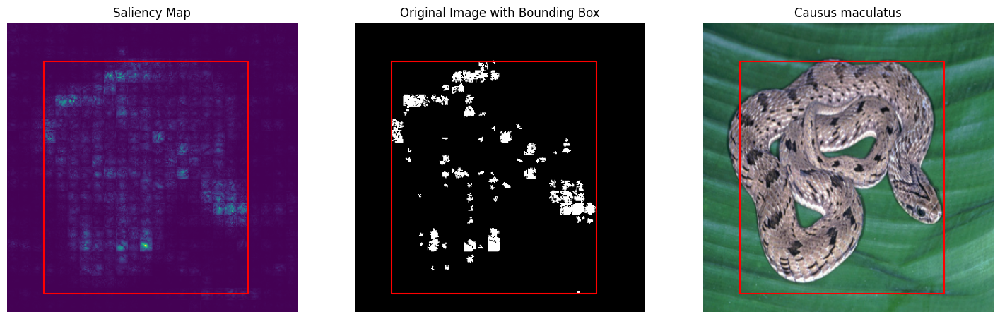

1991/Pseudalsophis_dorsalis/105775021.jpeg


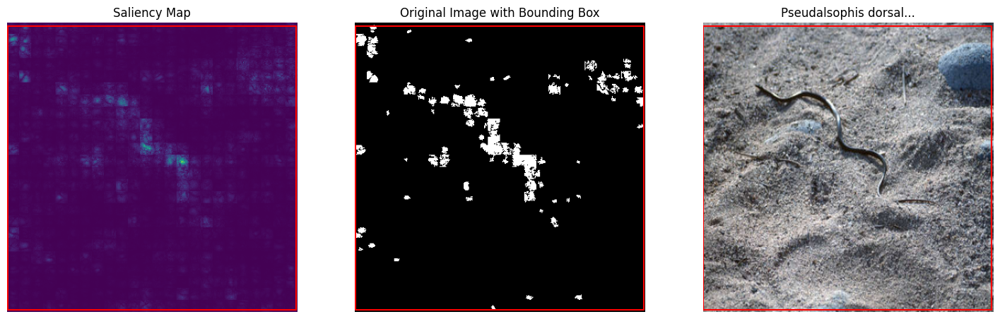

1991/Zamenis_situla/3001257.jpg


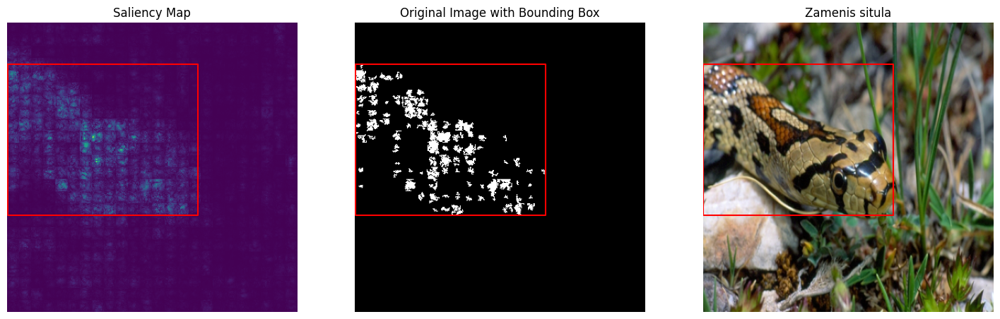

In [19]:
for i in range(20):
    # get image
    img, label = dataset[i]
    print(dataset.df['image_path'].iloc[i])

    # create saliency map
    saliency_map = saliency.get_saliency_map(model, img, label=label)

    # get bounding box covering highest intensities
    bbox, saliency_map_cleaned = saliency.get_bounding_box(
        saliency_map, bin_percentile=95, clust_pixel_th=10)

    # plot results
    fig, (ax1, ax2, ax3) = viz.create_fig(ncols=3, colsize=6, rowsize=6)

    viz.imshow(saliency_map, ax=ax1, cmap='viridis', bbox=bbox)
    ax1.axis('off')
    ax1.set(title='Saliency Map')

    viz.imshow(saliency_map_cleaned, ax=ax2, cmap='gray', bbox=bbox)
    ax2.axis('off')
    ax2.set(title='Cleaned Saliency Map with Bounding Box')

    dataset.show_item(i, ax=ax3, apply_transforms=tfms)
    viz.plot_bbox(bbox, ax=ax3)
    ax2.axis('off')
    ax2.set(title='Original Image with Bounding Box')

    plt.show()